<a href="https://colab.research.google.com/github/tejask-42/Modelling-Gravitational-Systems/blob/main/Week_2/Assignment_2_Gravitational_Systems.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import torch
from torch import tensor
from matplotlib import rcParams
rcParams['animation.embed_limit'] = 100

In [5]:
class Model:
    def __init__(self, G=6.67430e-11, m1=5.972e24, m2=7.347e22, r=1.92e8,
                 v1_mag=12.573, v2_mag=1022, steps=60000, dt=130, device="cpu", seed=42):
        """
        Initialize the model with default Earth-Moon system parameters.
        """
        self.device = device
        torch.manual_seed(seed) # to control orbit angle
        self.G = torch.tensor(G, device=self.device, dtype=torch.float32)
        self.m1 = torch.tensor(m1, device=self.device, dtype=torch.float32)
        self.m2 = torch.tensor(m2, device=self.device, dtype=torch.float32)
        self.r = torch.tensor(r, device=self.device, dtype=torch.float32)
        self.v1_mag = torch.tensor(v1_mag, device=self.device, dtype=torch.float32)
        self.v2_mag = torch.tensor(v2_mag, device=self.device, dtype=torch.float32)
        self.steps = steps
        self.dt = torch.tensor(dt, device=self.device, dtype=torch.float32)

        # Initial positions
        self.p1 = torch.tensor([r, 0.0, 0.0], dtype=torch.float32, device=self.device)
        self.p2 = torch.tensor([-r, 0.0, 0.0], dtype=torch.float32, device=self.device)

        # Random angle for initial velocities
        theta = torch.rand(1, device=self.device).item() * 2 * torch.pi
        theta = torch.tensor(theta, dtype=torch.float32)

        # Initial velocities
        self.v1 = torch.tensor([v1_mag * torch.cos(theta), v1_mag * torch.sin(theta), 0.0], dtype=torch.float32, device=self.device)
        self.v2 = torch.tensor([-v2_mag * torch.cos(theta), -v2_mag * torch.sin(theta), 0.0], dtype=torch.float32, device=self.device)

        # Initial accelerations
        self.a1 = torch.zeros(3, dtype=torch.float32, device=self.device)
        self.a2 = torch.zeros(3, dtype=torch.float32, device=self.device)

        # Store positions for plotting
        self.coords_1 = torch.zeros((steps + 1, 3), device=self.device, dtype=torch.float32)
        self.coords_2 = torch.zeros((steps + 1, 3), device=self.device, dtype=torch.float32)
        self.coords_1[0] = self.p1
        self.coords_2[0] = self.p2
        self.energy = torch.zeros(steps, device=self.device, dtype=torch.float32)

    def calculate_energy(self, step):
        self.energy[step - 1] = 0.5 * self.m1 * torch.norm(self.v1)**2 + 0.5 * self.m2 * torch.norm(self.v2)**2 - self.G * self.m1 * self.m2 / torch.norm(self.p1 - self.p2)

    def update(self, step): # method 1 of updating
        diff = self.p2 - self.p1
        r_dist = torch.norm(diff)

        F_gravity = self.G * self.m1 * self.m2 / r_dist**2

        self.a1.copy_((F_gravity * diff / r_dist) / self.m1)
        self.a2.copy_((-F_gravity * diff / r_dist) / self.m2)

        self.v1.add_(self.a1 * self.dt)
        self.v2.add_(self.a2 * self.dt)

        self.p1.add_(self.v1 * self.dt)
        self.p2.add_(self.v2 * self.dt)

        self.coords_1[step] = self.p1
        self.coords_2[step] = self.p2
        self.calculate_energy(step)

    def update2(self, step): # two step method of updating
      diff = self.p2 - self.p1
      r_dist = torch.norm(diff)

      F_gravity = self.G * self.m1 * self.m2 / r_dist**2

      self.a1.copy_((F_gravity * diff / r_dist) / self.m1)
      self.a2.copy_((-F_gravity * diff / r_dist) / self.m2)
      vm1 = self.v1 + (self.a1 * self.dt / 2)
      vm2 = self.v2 + (self.a2 * self.dt / 2)
      pm1 = self.p1 + (vm1 * self.dt / 2)
      pm2 = self.p2 + (vm2 * self.dt / 2)
      diff = pm2 - pm1
      r_dist2 = torch.norm(diff)
      F_gravity = self.G * self.m1 * self.m2 / r_dist2**2
      self.a1.copy_((F_gravity * diff / r_dist2) / self.m1)
      self.a2.copy_((-F_gravity * diff / r_dist2) / self.m2)

      self.v1.add_(self.a1 * self.dt)
      self.v2.add_(self.a2 * self.dt)

      self.p1.add_(self.v1 * self.dt)
      self.p2.add_(self.v2 * self.dt)

      self.coords_1[step] = self.p1
      self.coords_2[step] = self.p2
      self.calculate_energy(step)

    def run_simulation(self, method : int = 1):
        if method == 1:
            for step in range(1, self.steps + 1):
                self.update(step)
        elif method == 2:
            for step in range(1, self.steps + 1):
                self.update2(step)

    def animate(self, sample_rate=200, fps=20):
        # Downsample data to create animation faster
        coords_1 = self.coords_1[::sample_rate]
        coords_2 = self.coords_2[::sample_rate]

        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection="3d")
        ax.set_xlim([-2 * self.r, 2 * self.r])
        ax.set_ylim([-2 * self.r, 2 * self.r])
        ax.set_zlim([-2 * self.r, 2 * self.r])
        ax.set_xlabel("X Position (m)")
        ax.set_ylabel("Y Position (m)")
        ax.set_zlabel("Z Position (m)")

        earth_trail, = ax.plot([], [], [], 'b-', lw=0.1, label="Earth Path")
        moon_trail, = ax.plot([], [], [], 'r-', lw=0.5, label="Moon Path")
        earth_dot, = ax.plot([], [], [], 'bo', markersize=5)  # Earth as a blue dot
        moon_dot, = ax.plot([], [], [], 'ro', markersize=5)  # Moon as a red dot
        ax.legend()

        def init():
            earth_trail.set_data([], [])
            earth_trail.set_3d_properties([])
            moon_trail.set_data([], [])
            moon_trail.set_3d_properties([])
            earth_dot.set_data([], [])
            earth_dot.set_3d_properties([])
            moon_dot.set_data([], [])
            moon_dot.set_3d_properties([])
            return earth_trail, moon_trail, earth_dot, moon_dot

        def update(frame):
            # Update Earth's trail and dot
            earth_trail.set_data(coords_1[:frame, 0], coords_1[:frame, 1])
            earth_trail.set_3d_properties(coords_1[:frame, 2])
            earth_dot.set_data(coords_1[frame, 0], coords_1[frame, 1])
            earth_dot.set_3d_properties(coords_1[frame, 2])

            # Update Moon's trail and dot
            moon_trail.set_data(coords_2[:frame, 0], coords_2[:frame, 1])
            moon_trail.set_3d_properties(coords_2[:frame, 2])
            moon_dot.set_data(coords_2[frame, 0], coords_2[frame, 1])
            moon_dot.set_3d_properties(coords_2[frame, 2])

            return earth_trail, moon_trail, earth_dot, moon_dot

        # Create the animation
        ani = FuncAnimation(fig, update, frames=len(coords_1), init_func=init, interval=1000 // fps, blit=True)
        return HTML(ani.to_jshtml())

    def plot(self):
        plt.figure(figsize=(8, 8))
        plt.plot(self.coords_1[:, 0], self.coords_1[:, 1], color='blue', label="Earth Path")
        plt.plot(self.coords_2[:, 0], self.coords_2[:, 1], color='red', label="Moon Path")

        plt.title('2-Body Gravitational System')
        plt.xlabel('X Position')
        plt.ylabel('Y Position')
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_energy(self):
        plt.figure(figsize=(8, 8))
        plt.plot(self.energy, color='blue')

        plt.title('Energy of the System (Joules)')
        plt.xlabel('Time')
        plt.ylabel('Energy')
        plt.grid(True)
        plt.show()

<ipython-input-5-c7814df0fa97>:134: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  earth_dot.set_data(coords_1[frame, 0], coords_1[frame, 1])
<ipython-input-5-c7814df0fa97>:140: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  moon_dot.set_data(coords_2[frame, 0], coords_2[frame, 1])


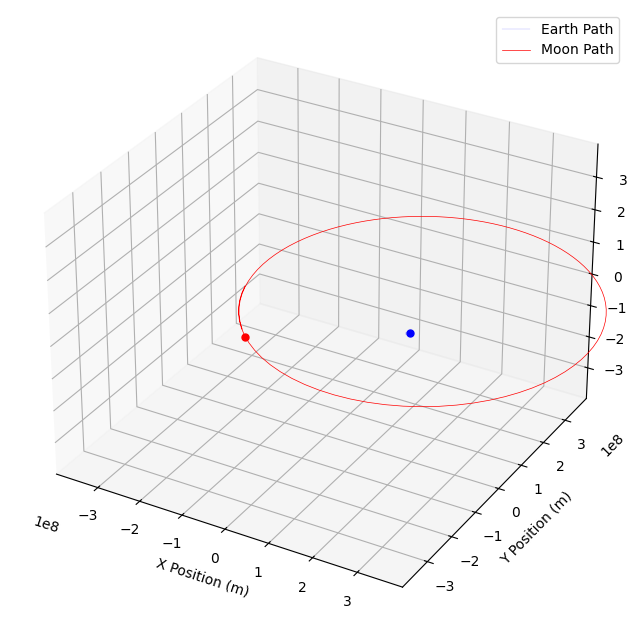

In [7]:
model = Model(steps=20000, seed=123)
model.run_simulation(method=2)
model.animate()

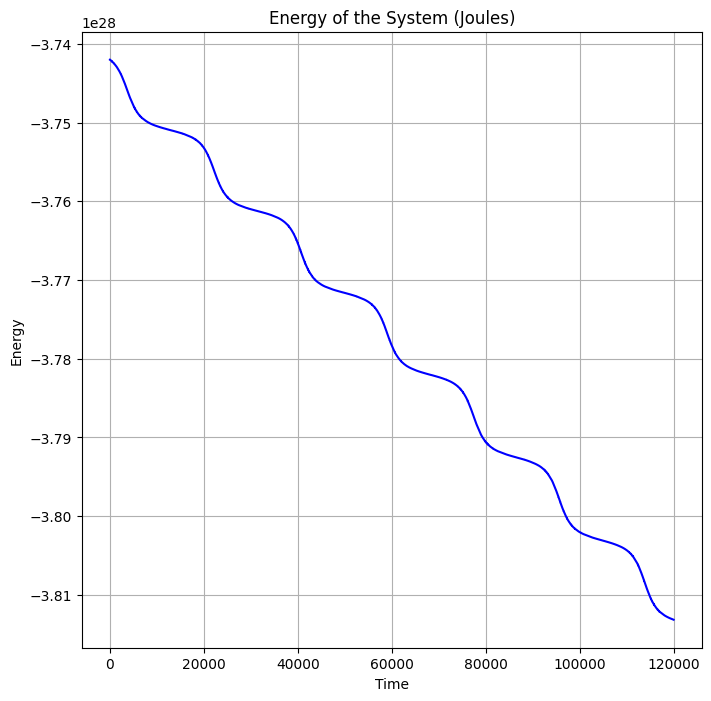

tensor([-3.7420e+28, -3.7420e+28, -3.7420e+28,  ..., -3.8132e+28,
        -3.8132e+28, -3.8132e+28])


In [3]:
model.plot_energy()
print(model.energy)